In [19]:
import torch
import torchvision
from torchvision import transforms
from PIL import Image
import cv2
from google.colab.patches import cv2_imshow
import os  # Import the os module

In [20]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

In [21]:
# Load and preprocess the image
image = Image.open("/content/derek-lee-C031beKcwdQ-unsplash.jpg")
transform = transforms.ToTensor()
transformed_image = transform(image)

In [22]:
# Perform object detection
with torch.no_grad():
    prediction = model([transformed_image])

In [23]:
prediction

[{'boxes': tensor([[2.0173e+03, 2.4964e+03, 2.4310e+03, 2.8768e+03],
          [3.0504e+02, 2.3601e+03, 6.4383e+02, 2.7253e+03],
          [6.5616e+02, 2.3587e+03, 1.0188e+03, 2.7336e+03],
          [5.2904e+02, 2.1703e+03, 8.0604e+02, 2.4152e+03],
          [5.8871e+02, 1.9286e+03, 7.7979e+02, 2.0681e+03],
          [1.5157e+03, 1.9991e+03, 1.6780e+03, 2.1544e+03],
          [1.7563e+03, 2.0502e+03, 1.9846e+03, 2.2326e+03],
          [7.8732e+01, 2.8864e+03, 7.4929e+02, 3.6365e+03],
          [8.1235e+02, 3.0095e+03, 1.3615e+03, 3.7325e+03],
          [2.0067e+03, 2.2416e+03, 2.3051e+03, 2.5069e+03],
          [5.2782e+02, 1.8835e+03, 5.7383e+02, 2.0079e+03],
          [1.6176e+03, 2.3845e+03, 1.9169e+03, 2.6865e+03],
          [6.9668e+02, 2.0089e+03, 9.1486e+02, 2.2150e+03],
          [2.5691e+03, 2.4217e+03, 2.6951e+03, 2.6660e+03],
          [8.7965e+02, 2.1283e+03, 1.0963e+03, 2.3627e+03],
          [1.6058e+03, 2.8429e+03, 2.0904e+03, 3.4574e+03],
          [2.4164e+03, 3.2147e+

In [24]:
# Extract prediction information
bounding_boxes, classes, scores = prediction[0]["boxes"], prediction[0]["labels"], prediction[0]["scores"]

In [25]:
# Define COCO class names
coco_names = ["person", "bicycle", "car", "motorcycle", "airplane", "bus", "train", "truck", "boat",
              "traffic light", "fire hydrant", "street sign", "stop sign", "parking meter", "bench",
              "bird", "cat", "dog", "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe",
              "hat", "backpack", "umbrella", "shoe", "eye glasses", "handbag", "tie", "suitcase",
              "frisbee", "skis", "snowboard", "sports ball", "kite", "baseball bat", "baseball glove",
              "skateboard", "surfboard", "tennis racket", "bottle", "plate", "wine glass", "cup", "fork",
              "knife", "spoon", "bowl", "banana", "apple", "sandwich", "orange", "broccoli", "carrot",
              "hot dog", "pizza", "donut", "cake", "chair", "couch", "potted plant", "bed", "mirror",
              "dining table", "window", "desk", "toilet", "door", "tv", "laptop", "mouse", "remote",
              "keyboard", "cell phone", "microwave", "oven", "toaster", "sink", "refrigerator", "blender",
              "book", "clock", "vase", "scissors", "teddy bear", "hair drier", "toothbrush", "hair brush",
              "banner", "blanket", "branch", "bridge", "building-other", "bush", "cabinet", "cage", "cardboard",
              "carpet", "case", "ceiling-other", "ceiling-tile", "cloth", "clothes", "clouds", "counter",
              "cupboard", "curtain", "desk-stuff", "dirt", "door-stuff", "fence", "floor-marble", "floor-other",
              "floor-stone", "floor-tile", "floor-wood", "flower", "fog", "food-other", "fruit", "furniture-other",
              "grass", "gravel", "ground-other", "hill", "house", "leaves", "light", "mat", "metal", "mirror-stuff",
              "moss", "mountain", "mud", "napkin", "net", "paper", "pavement", "pillow", "plant-other", "plastic",
              "platform", "playingfield", "railing", "railroad", "river", "road", "rock", "roof", "rug", "salad",
              "sand", "sea", "shelf", "sky-other", "skyscraper", "snow", "solid-other", "stairs", "stone", "straw",
              "structural-other", "table", "tent", "textile-other", "towel", "tree", "vegetable", "wall-brick",
              "wall-concrete", "wall-other", "wall-panel", "wall-stone", "wall-tile", "wall-wood", "water-other",
              "waterdrops", "window-blind", "window-other", "wood"]

In [26]:
# Filter objects based on confidence threshold
confidence_threshold = 0.8
number_of_objects = torch.sum(scores > confidence_threshold)

In [51]:
# Draw bounding boxes, labels, and scores on the image
imgg = cv2.imread("/content/derek-lee-C031beKcwdQ-unsplash.jpg")
count = 1  # Counter for labeling objects
for i in range(number_of_objects):
    x1, y1, x2, y2 = bounding_boxes[i].numpy().astype("int")
    class_of_object = coco_names[classes[i].numpy() - 1]
    score_of_object = scores[i].numpy()
    imgg = cv2.rectangle(imgg, (x1, y1), (x2, y2), (0, 0, 400), 1)
    imgg = cv2.putText(imgg, f"{class_of_object}_{count}: {score_of_object:.2f}", (x1, y1 - 10), cv2.FONT_HERSHEY_SCRIPT_COMPLEX, 1, (0, 400, 0))
    count += 1  # Increment the counter

In [52]:
# Create a directory to save the cropped images
output_dir = "/content/cropped_images"
os.makedirs(output_dir, exist_ok=True)

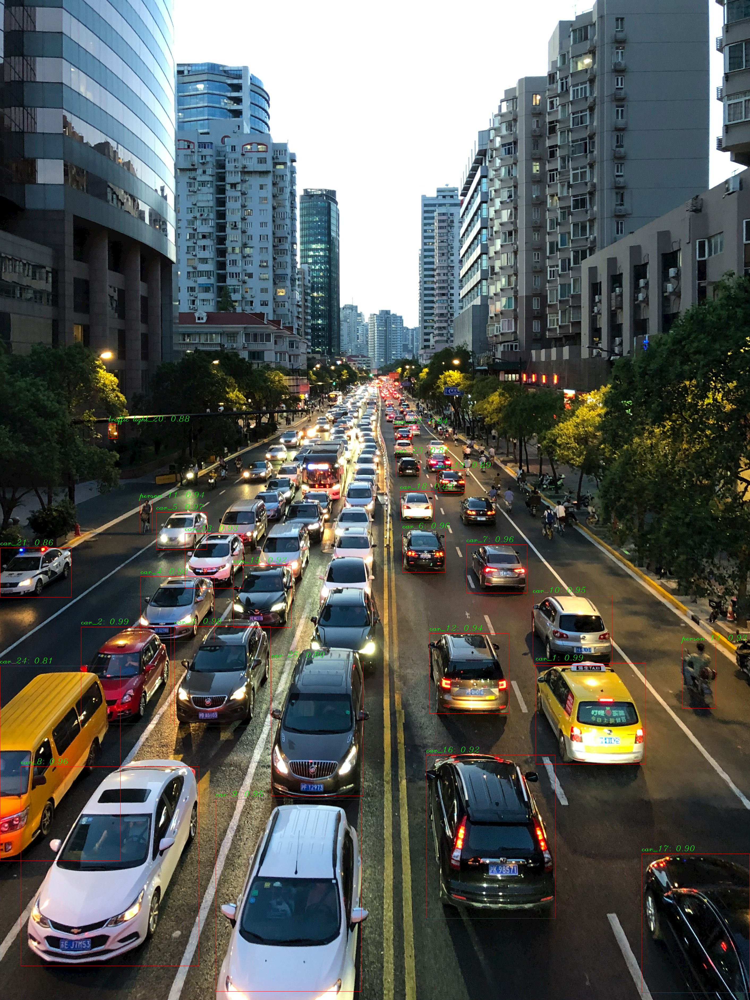

In [53]:
# Display the annotated image
cv2_imshow(imgg)

In [ ]:
# Save and display cropped images
for i in range(len(scores)):
    if scores[i] > confidence_threshold:
        x1, y1, x2, y2 = bounding_boxes[i].numpy().astype("int")
        class_of_object = coco_names[classes[i].numpy() - 1]

        # Crop the object from the original image
        cropped_image = image.crop((x1, y1, x2, y2))

        # Save the cropped image with its label
        cropped_image_path = os.path.join(output_dir, f"{class_of_object}_{i}.jpg")
        cropped_image.save(cropped_image_path)

        # Display the cropped image
        cv2_imshow(cv2.imread(cropped_image_path))